# Customer Segmentation
## Preparing Data for Customer Segmentation

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from datetime import datetime, timezone

from sklearn.preprocessing import PowerTransformer
from sklearn.preprocessing import StandardScaler

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, calinski_harabasz_score

import pickle
import os

In [2]:
df = pd.read_csv('../data/cleaned/customer_data_for_segmentation.csv')

In [3]:
df.head()

,user_id,registration_date,age,gender,city,country,first_order_date,last_order_date,total_orders,avg_order_items,...,order_frequency_per_year,days_since_first_order,days_since_last_order,days_since_registration,days_until_first_order,days_betw_first_last_order,days_until_last_order,age_class,registration_year,registration_month
0,18,2020-06-18 10:15:00+00:00,31,M,Schwedt/Oder,Poland,2021-05-26 10:15:00+00:00,2021-05-26 10:15:00+00:00,1,1.0,...,3.918697e-16,949.572917,949.572917,1291.572917,342.0,0.0,342.0,31-40,2020,6
1,29,2023-09-22 07:18:00+00:00,23,M,Pudsey,United Kingdom,2023-11-29 07:18:00+00:00,2023-11-29 07:18:00+00:00,1,2.0,...,1.138093e-14,32.695833,32.695833,100.695833,68.0,0.0,68.0,19-30,2023,9
2,33,2019-02-14 17:19:00+00:00,12,M,Bogatynia,Poland,2020-06-02 17:19:00+00:00,2020-06-11 17:19:00+00:00,2,1.0,...,5.692878e-16,1307.278472,1298.278472,1781.278472,474.0,9.0,483.0,0-18,2019,2
3,49,2023-04-11 02:46:00+00:00,62,M,Bailleul,France,2023-08-20 02:46:00+00:00,2023-08-20 02:46:00+00:00,1,1.0,...,2.779323e-15,133.884722,133.884722,264.884722,131.0,0.0,131.0,61-70,2023,4
4,50,2023-05-01 13:46:00+00:00,15,F,Linares,Spain,2023-07-10 13:46:00+00:00,2023-09-27 13:46:00+00:00,2,1.5,...,4.266658e-15,174.426389,95.426389,244.426389,70.0,79.0,149.0,0-18,2023,5


In [4]:
df.shape

(14047, 23)

The dataframe already contains all columns needed to create the RFM model.
Let's select them:

In [5]:
rfm_df = df[['user_id', 'days_since_last_order', 'total_orders', 'total_revenue']]
rfm_df.columns = ['user_id', 'recency', 'frequency', 'monetary']

In [6]:
rfm_df.head()

,user_id,recency,frequency,monetary
0,18,949.572917,1,46.990002
1,29,32.695833,1,65.680000
2,33,1298.278472,2,73.959999
3,49,133.884722,1,65.000000
4,50,95.426389,2,512.740005


In [7]:
rfm_df.describe()

,user_id,recency,frequency,monetary
count,14047.000000,14047.000000,14047.000000,14047.000000
mean,49958.768420,398.783169,1.533566,269.701689
std,28820.378798,375.157102,0.836478,412.242679
min,18.000000,0.213889,1.000000,0.490000
25%,25003.500000,98.942014,1.000000,42.190001
50%,49629.000000,278.868750,1.000000,111.990000
75%,75060.000000,599.751042,2.000000,301.969999
max,99999.000000,1794.915972,4.000000,3954.280006


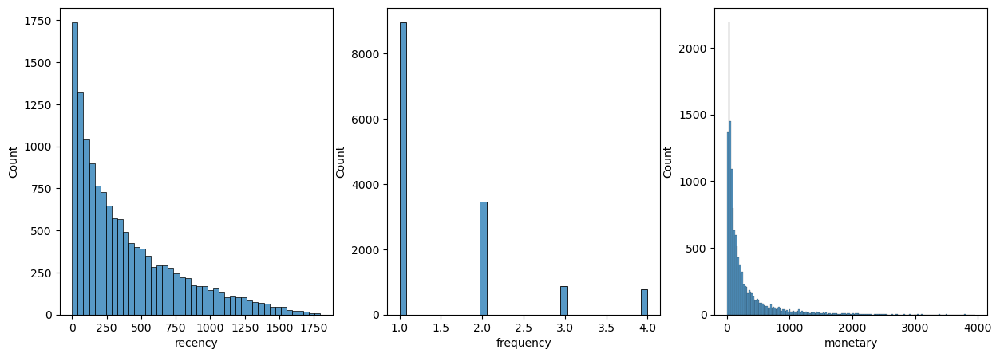

In [8]:
# The variables shouldn't be skewed and should have the same mean and variance. Let's check:

fig, ax = plt.subplots(1,3, figsize=(15,5))
sns.histplot(rfm_df, x='recency', ax=ax[0])
sns.histplot(rfm_df, x='frequency', ax=ax[1])
sns.histplot(rfm_df, x='monetary', ax=ax[2])
plt.show()

The monetary and recency variables are skewed while frequency is an ordinal variable.
- Right-skewed recency: Most customers have made recent purchases, and there is a long tail of customers who haven't made purchases for a longer time. Remember, before the customers that haven't purchased anything in 3 years were already filtered out.

- Right-skewed monetary: Most customers have lower monetary values, and there is a long tail of customers with some higher monetary values.

- Low frequency: Most customers are one time purchasers. Maximum of purchase counts is 4.

In the next step, the data will be transformed. It's checked if yeo-johnson or box-cox transformation works best to transform the variables.

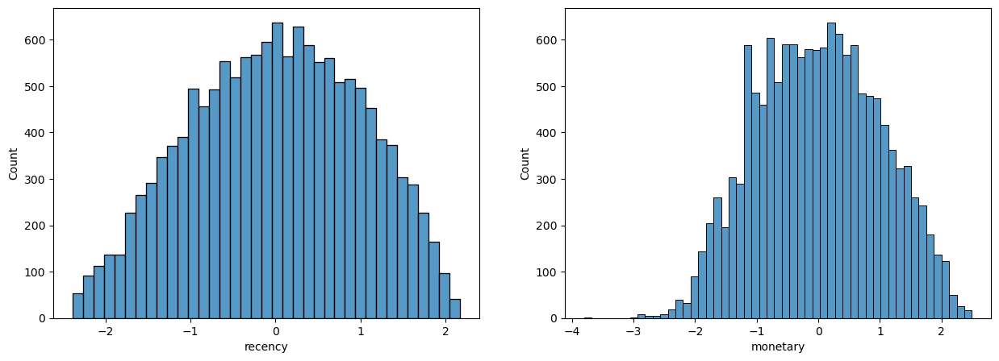

Skew of recency is:  -0.1
Skew of monetary is:  0.02


In [9]:
# transforming frequency doesn't make sense because it's ordinal
to_be_transformed_df1 = rfm_df[['recency', 'monetary']]

# First checking how the distribution looks like with method yeo-johnson
transformer1 = PowerTransformer(method='yeo-johnson')
transformed1 = transformer1.fit_transform(to_be_transformed_df1)

transformed_df1 = pd.DataFrame(transformed1, columns=to_be_transformed_df1.columns)

fig, ax = plt.subplots(1,2, figsize=(15,5))
sns.histplot(transformed_df1, x='recency', ax=ax[0])
sns.histplot(transformed_df1, x='monetary', ax=ax[1])
plt.show()

print('Skew of recency is: ', transformed_df1['recency'].skew().round(2))
print('Skew of monetary is: ', transformed_df1['monetary'].skew().round(2))

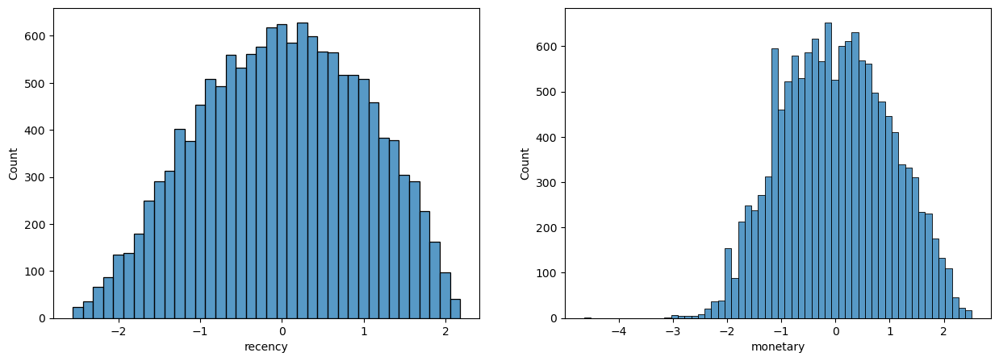

Skew of recency is:  -0.11
Skew of monetary is:  0.01


In [10]:
# testing the transformation with box-cox as well

to_be_transformed_df2 = rfm_df[['recency', 'monetary']]
transformer2 = PowerTransformer(method='box-cox')
transformed2 = transformer2.fit_transform(to_be_transformed_df2)
transformed_df2 = pd.DataFrame(transformed2, columns=to_be_transformed_df2.columns)

path = '../transformers/'
filename = "r_m_boxcox.pkl" 
with open(path+filename, "wb") as file:
    pickle.dump(transformer2,file)
        
        
fig, ax = plt.subplots(1,2, figsize=(15,5))
sns.histplot(transformed_df2, x='recency', ax=ax[0])
sns.histplot(transformed_df2, x='monetary', ax=ax[1])
plt.show()

print('Skew of recency is: ', transformed_df2['recency'].skew().round(2))
print('Skew of monetary is: ', transformed_df2['monetary'].skew().round(2))

In [11]:
# the transformers perform very simlar. lets continue with the yeo-johnson transformation
transformed_df1.describe()

,recency,monetary
count,1.404700e+04,1.404700e+04
mean,-1.689480e-16,6.019405e-17
std,1.000036e+00,1.000036e+00
min,-2.385571e+00,-3.799786e+00
25%,-7.508445e-01,-7.673811e-01
50%,2.876264e-02,-2.025065e-03
75%,7.744228e-01,7.408945e-01
max,2.170810e+00,2.492313e+00


In [12]:
transformed_df = pd.concat([rfm_df['frequency'],transformed_df1[['recency', 'monetary']]], axis=1)

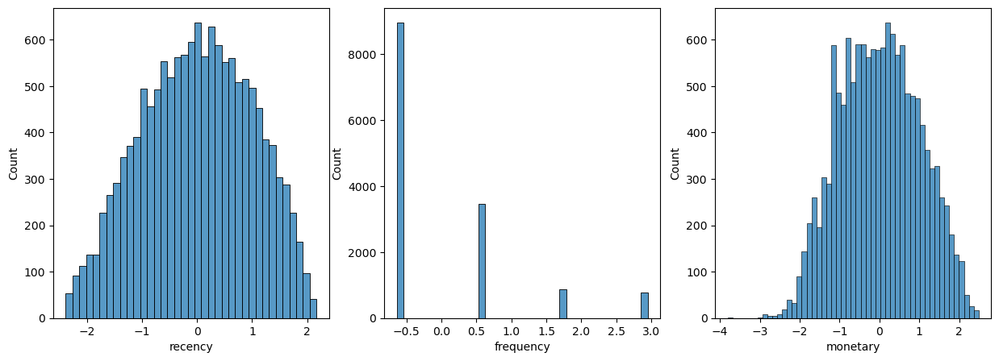

In [13]:
scaler = StandardScaler()

scaled = scaler.fit_transform(transformed_df)
scaled_df = pd.DataFrame(scaled, columns=transformed_df.columns)

fig, ax = plt.subplots(1,3, figsize=(15,5))
sns.histplot(scaled_df, x='recency', ax=ax[0])
sns.histplot(scaled_df, x='frequency', ax=ax[1])
sns.histplot(scaled_df, x='monetary', ax=ax[2])
plt.show()


In [14]:
scaled_df.describe()

,frequency,recency,monetary
count,1.404700e+04,1.404700e+04,1.404700e+04
mean,1.229173e-16,2.933828e-17,5.058324e-18
std,1.000036e+00,1.000036e+00,1.000036e+00
min,-6.378946e-01,-2.385571e+00,-3.799786e+00
25%,-6.378946e-01,-7.508445e-01,-7.673811e-01
50%,-6.378946e-01,2.876264e-02,-2.025065e-03
75%,5.576365e-01,7.744228e-01,7.408945e-01
max,2.948699e+00,2.170810e+00,2.492313e+00


In [15]:
print(scaled_df.mean(axis = 0).round(2)) 
print(scaled_df.std(axis = 0).round(2)) 

frequency    0.0
recency      0.0
monetary     0.0
dtype: float64
frequency    1.0
recency      1.0
monetary     1.0
dtype: float64


## Applying RFM Scoring Model

In [16]:
# RFM has 4 clusters in each category
kmeans = KMeans(n_clusters=4)
kmeans.fit(scaled_df[['recency']])
scaled_df['recency_cluster'] = kmeans.predict(scaled_df[['recency']])

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [17]:
# Evaluate the clustering using silhouette score
silhouette_avg = silhouette_score(scaled_df[['recency']], scaled_df['recency_cluster'])
print(f"Silhouette Score: {silhouette_avg}")

Silhouette Score: 0.5390561789625151


In [18]:
def order_cluster(clusters: str, score: str, df: pd.DataFrame, ascending):
    """
    Takes the generated clusters, orders them and assigns them to the final cluster score.
    """
    
    # Calculate mean frequency for each cluster
    mean_frequency_per_cluster = df.groupby(clusters)[score].mean()

    # Order clusters based on mean frequency
    ordered_clusters = mean_frequency_per_cluster.sort_values(ascending=ascending).index

    # Map the original cluster labels to the ordered clusters
    df['frequency_cluster'] = df[clusters].map(dict(zip(ordered_clusters, range(len(ordered_clusters)))))

    return df[['frequency_cluster']]

In [19]:
rfm_df['recency_cluster'] = order_cluster('recency_cluster', 'recency', scaled_df, False)

/var/folders/xv/sbmlp5m11vlc8qbxx5xp1lfw0000gp/T/ipykernel_29274/2912497725.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rfm_df['recency_cluster'] = order_cluster('recency_cluster', 'recency', scaled_df, False)


In [20]:
rfm_df['recency_cluster'].value_counts()

recency_cluster
1    4287
2    3972
0    3269
3    2519
Name: count, dtype: int64

In [21]:
kmeans = KMeans(n_clusters=4)
kmeans.fit(scaled_df[['frequency']])
scaled_df['frequency_cluster'] = kmeans.predict(scaled_df[['frequency']])

# Evaluate the clustering using silhouette score
silhouette_avg = silhouette_score(scaled_df[['frequency']], scaled_df['frequency_cluster'])
print(f"Silhouette Score: {silhouette_avg}")

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Silhouette Score: 1.0


In [22]:
rfm_df['frequency_cluster'] = order_cluster('frequency_cluster', 'frequency', scaled_df, True)

/var/folders/xv/sbmlp5m11vlc8qbxx5xp1lfw0000gp/T/ipykernel_29274/2337404798.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rfm_df['frequency_cluster'] = order_cluster('frequency_cluster', 'frequency', scaled_df, True)


In [23]:
rfm_df['frequency_cluster'].value_counts()

frequency_cluster
0    8953
1    3458
2     871
3     765
Name: count, dtype: int64

In [24]:
# Again, we need to split in 4 clusters
kmeans = KMeans(n_clusters=4)
kmeans.fit(scaled_df[['monetary']])
scaled_df['monetary_cluster'] = kmeans.predict(scaled_df[['monetary']])
rfm_df['monetary_cluster'] = order_cluster('monetary_cluster', 'monetary', scaled_df, True)

# Evaluate the clustering using silhouette score
silhouette_avg = silhouette_score(scaled_df[['monetary']], scaled_df['monetary_cluster'])
print(f"Silhouette Score: {silhouette_avg}")

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/var/folders/xv/sbmlp5m11vlc8qbxx5xp1lfw0000gp/T/ipykernel_29274/1955502200.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rfm_df['monetary_cluster'] = order_cluster('monetary_cluster', 'monetary', scaled_df, True)


Silhouette Score: 0.5383032785983707


In [25]:
rfm_df['monetary_cluster'].value_counts()

monetary_cluster
2    4331
1    4232
0    2780
3    2704
Name: count, dtype: int64

In [26]:
rfm_df.describe().T

,count,mean,std,min,25%,50%,75%,max
user_id,14047.0,49958.768420,28820.378798,18.000000,25003.500000,49629.00000,75060.000000,99999.000000
recency,14047.0,398.783169,375.157102,0.213889,98.942014,278.86875,599.751042,1794.915972
frequency,14047.0,1.533566,0.836478,1.000000,1.000000,1.00000,2.000000,4.000000
monetary,14047.0,269.701689,412.242679,0.490000,42.190001,111.99000,301.969999,3954.280006
recency_cluster,14047.0,1.408699,1.032391,0.000000,1.000000,1.00000,2.000000,3.000000
frequency_cluster,14047.0,0.533566,0.836478,0.000000,0.000000,0.00000,1.000000,3.000000
monetary_cluster,14047.0,1.495408,1.015313,0.000000,1.000000,2.00000,2.000000,3.000000


In [27]:
rfm_df.groupby('recency_cluster')['recency'].describe()

,count,mean,std,min,25%,50%,75%,max
recency_cluster,,,,,,,,
0,3269.0,975.415538,263.551464,634.525000,754.763889,917.681944,1153.564583,1794.915972
1,4287.0,410.930331,110.160950,244.786806,314.466319,395.621528,501.149306,634.279861
2,3972.0,145.083606,52.255995,64.830556,98.956771,139.485764,188.846007,244.644444
3,2519.0,29.830634,18.702423,0.213889,13.829167,28.487500,45.396528,64.800694


In [28]:
rfm_df.groupby('frequency_cluster')['frequency'].describe()

,count,mean,std,min,25%,50%,75%,max
frequency_cluster,,,,,,,,
0,8953.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0
1,3458.0,2.0,0.0,2.0,2.0,2.0,2.0,2.0
2,871.0,3.0,0.0,3.0,3.0,3.0,3.0,3.0
3,765.0,4.0,0.0,4.0,4.0,4.0,4.0,4.0


In [29]:
rfm_df.groupby('monetary_cluster')['monetary'].describe()

,count,mean,std,min,25%,50%,75%,max
monetary_cluster,,,,,,,,
0,2780.0,21.075309,7.739581,0.490000,14.730000,22.000000,27.000000,34.450001
1,4232.0,65.815671,21.683398,34.490000,46.997500,62.395001,82.990000,111.430001
2,4331.0,217.856650,79.783165,111.870003,149.980000,198.980000,275.000000,399.800003
3,2704.0,927.456062,553.482868,399.879993,527.969999,745.859999,1141.380002,3954.280006


In [30]:
#overall scoring
rfm_df['total_score'] = rfm_df['recency_cluster'] + rfm_df['frequency_cluster'] + rfm_df['monetary_cluster']
#rfm_df['total_score'] = rfm_df['recency_cluster'] + rfm_df['monetary_cluster']

/var/folders/xv/sbmlp5m11vlc8qbxx5xp1lfw0000gp/T/ipykernel_29274/715130164.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rfm_df['total_score'] = rfm_df['recency_cluster'] + rfm_df['frequency_cluster'] + rfm_df['monetary_cluster']


In [31]:
# checking the average RFM in every score
rfm_df.groupby('total_score')[['recency', 'frequency', 'monetary']].mean()
#rfm_df.groupby('total_score')[['recency', 'monetary']].mean()

,recency,frequency,monetary
total_score,,,
0,996.816458,1.000000,21.230953
1,737.682857,1.000495,44.279005
2,496.754339,1.024257,83.850638
3,323.323176,1.166803,123.904050
4,262.833123,1.458272,205.055018
5,200.236601,1.799483,345.522879
6,160.729052,2.273375,539.191336
7,160.845354,2.955494,931.780154
8,91.390182,3.582375,1173.314618


In [32]:
rfm_scores_only = rfm_df[['total_score']]
rfm_scores_only.head()

,total_score
0,1
1,4
2,2
3,3
4,6


/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Training a K-Means model with 2 clusters! 

Initialization complete
Iteration 0, inertia 34397.0.
Iteration 1, inertia 25821.401669418636.
Iteration 2, inertia 20559.99978535975.
Converged at iteration 2: strict convergence.
Initialization complete
Iteration 0, inertia 24740.0.
Iteration 1, inertia 21426.383621992405.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 27546.0.
Iteration 1, inertia 20559.99978535975.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 22389.0.
Iteration 1, inertia 20559.99978535975.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 26775.0.
Iteration 1, inertia 21426.383621992405.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 40086.0.
Iteration 1, inertia 30054.923255361275.
Iteration 2, inertia 24941.867188479388.
Iteration 3, inertia 21426.383621992405.
Converged at iteration 3: strict con

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Training a K-Means model with 4 clusters! 

Initialization complete
Iteration 0, inertia 7403.0.
Iteration 1, inertia 7001.014790024045.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 11453.0.
Iteration 1, inertia 9560.936580330897.
Iteration 2, inertia 7525.901676294628.
Converged at iteration 2: strict convergence.
Initialization complete
Iteration 0, inertia 10401.0.
Iteration 1, inertia 9055.822906143745.
Iteration 2, inertia 6216.190050188119.
Converged at iteration 2: strict convergence.
Initialization complete
Iteration 0, inertia 8666.0.
Iteration 1, inertia 5267.445635997762.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 7507.0.
Iteration 1, inertia 5267.445635997762.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 10849.0.
Iteration 1, inertia 8422.638938435299.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, in

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Iteration 2, inertia 5423.855422264354.
Converged at iteration 2: strict convergence.
Training a K-Means model with 5 clusters! 

Initialization complete
Iteration 0, inertia 5857.0.
Iteration 1, inertia 3140.20004156619.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 4952.0.
Iteration 1, inertia 3140.20004156619.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 9129.0.
Iteration 1, inertia 6163.8640308513095.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 4951.0.
Iteration 1, inertia 4015.985572099701.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 8397.0.
Iteration 1, inertia 6574.622832638352.
Iteration 2, inertia 4540.872458370422.
Converged at iteration 2: strict convergence.
Initialization complete
Iteration 0, inertia 6099.0.
Iteration 1, inertia 3932.534669490047.
Converged at iteration 1: strict convergenc

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Iteration 0, inertia 6961.0.
Iteration 1, inertia 3665.086927836879.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 5906.0.
Iteration 1, inertia 5107.1214774831315.
Converged at iteration 1: strict convergence.
Training a K-Means model with 6 clusters! 

Initialization complete
Iteration 0, inertia 4660.0.
Iteration 1, inertia 2519.8928044320883.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 4942.0.
Iteration 1, inertia 2537.094796689431.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 3647.0.
Iteration 1, inertia 2823.4660967850086.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 3405.0.
Iteration 1, inertia 2031.1314688611621.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 3350.0.
Iteration 1, inertia 2823.4660967850086.
Converged at iteration 1: strict convergence.
In

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Iteration 0, inertia 4086.0.
Iteration 1, inertia 2556.0183551319496.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 3828.0.
Iteration 1, inertia 2031.1314688611621.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 3350.0.
Iteration 1, inertia 2823.4660967850086.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 2927.0.
Iteration 1, inertia 2031.1314688611621.
Converged at iteration 1: strict convergence.
Training a K-Means model with 7 clusters! 

Initialization complete
Iteration 0, inertia 2208.0.
Iteration 1, inertia 1410.8242317270706.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 4763.0.
Iteration 1, inertia 2307.1112433620165.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 2101.0.
Iteration 1, inertia 1198.6821518531149.
Converged at iteration 1: strict convergence.


/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Initialization complete
Iteration 0, inertia 3367.0.
Iteration 1, inertia 1935.7111179979056.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 1804.0.
Iteration 1, inertia 1198.6821518531149.
Converged at iteration 1: strict convergence.
Training a K-Means model with 8 clusters! 

Initialization complete
Iteration 0, inertia 944.0.
Iteration 1, inertia 777.5361527967177.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 1085.0.
Iteration 1, inertia 760.3341605393407.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 944.0.
Iteration 1, inertia 595.5769069764389.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 1085.0.
Iteration 1, inertia 760.3341605393407.
Converged at iteration 1: strict convergence.


/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Initialization complete
Iteration 0, inertia 944.0.
Iteration 1, inertia 595.5769069764389.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 944.0.
Iteration 1, inertia 595.5769069764389.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 944.0.
Iteration 1, inertia 595.5769069764389.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 1085.0.
Iteration 1, inertia 760.3341605393407.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 1241.0.
Iteration 1, inertia 595.5769069764389.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 944.0.
Iteration 1, inertia 595.5769069764389.
Converged at iteration 1: strict convergence.
Training a K-Means model with 9 clusters! 

Initialization complete
Iteration 0, inertia 225.0.
Iteration 1, inertia 157.22891566265037.
Converged at iteration 1: strict 

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Iteration 0, inertia 225.0.
Iteration 1, inertia 157.22891566265037.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 225.0.
Iteration 1, inertia 157.22891566265037.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 522.0000000000001.
Iteration 1, inertia 302.43190975020303.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 225.0.
Iteration 1, inertia 157.22891566265037.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 225.0.
Iteration 1, inertia 157.22891566265037.
Converged at iteration 1: strict convergence.


Text(0.5, 1.0, 'Silhouette Method showing the optimal k')

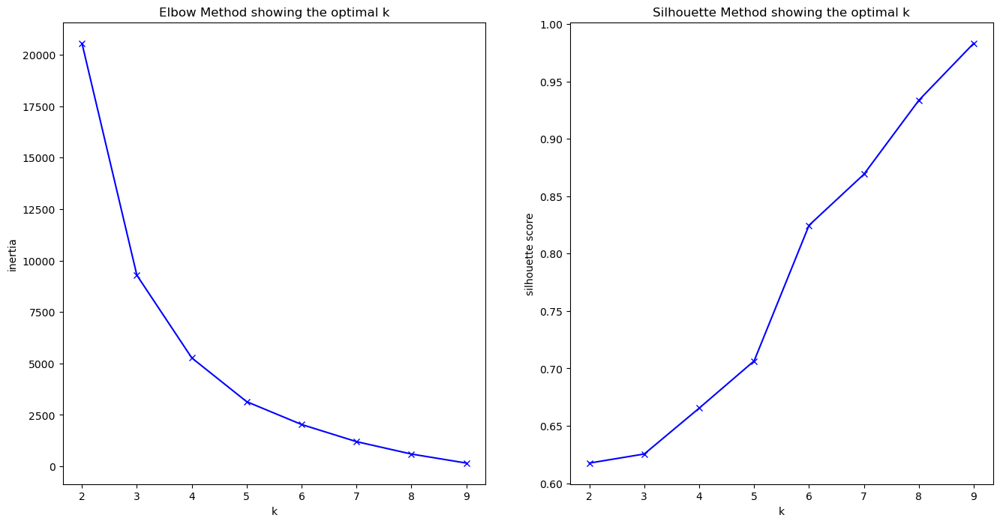

In [33]:
# We have a maximum total score of 9. Let's figure out how many clusters are optimal to segment the customers based on the scoring.

K = range(2, 10) #max 9 clusters

inertia = []
silhouette = []

for k in K:
    print("Training a K-Means model with {} clusters! ".format(k))
    print()
    kmeans = KMeans(n_clusters=k,
                    random_state=1234,
                    verbose=1)
    kmeans.fit(rfm_scores_only)
    
    path = '../models/'
    filename = "kmeans_rfm_scores_" + str(k) + ".pkl" 
    with open(path+filename, "wb") as file:
        pickle.dump(kmeans,file)

    inertia.append(kmeans.inertia_)
    silhouette.append(silhouette_score(rfm_scores_only, kmeans.predict(rfm_scores_only)))


import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

fig, ax = plt.subplots(1,2,figsize=(16,8))
ax[0].plot(K, inertia, 'bx-')
ax[0].set_xlabel('k')
ax[0].set_ylabel('inertia')
ax[0].set_xticks(np.arange(min(K), max(K)+1, 1.0))
ax[0].set_title('Elbow Method showing the optimal k')
ax[1].plot(K, silhouette, 'bx-')
ax[1].set_xlabel('k')
ax[1].set_ylabel('silhouette score')
ax[1].set_xticks(np.arange(min(K), max(K)+1, 1.0))
ax[1].set_title('Silhouette Method showing the optimal k')

In [34]:
def load(filename = "filename.pkl"):
    try:
        with open(filename, "rb") as file:
            return pickle.load(file)
    except FileNotFoundError:
        print("File not found!")

In [35]:
# optimal k between 3-5. silhouette score improving as k increases -> unclear which k to choose
# appyling according to business knowledge and choosing k:
best_model_scoring = load("../models/kmeans_rfm_scores_3.pkl")

In [36]:
rfm_copy = rfm_df.copy()
rfm_copy['kmeans_total_scores_n3'] = best_model_scoring.predict(rfm_scores_only)
rfm_copy

,user_id,recency,frequency,monetary,recency_cluster,frequency_cluster,monetary_cluster,total_score,kmeans_total_scores_n3
0,18,949.572917,1,46.990002,0,0,1,1,1
1,29,32.695833,1,65.680000,3,0,1,4,0
2,33,1298.278472,2,73.959999,0,1,1,2,1
3,49,133.884722,1,65.000000,2,0,1,3,0
4,50,95.426389,2,512.740005,2,1,3,6,2
...,...,...,...,...,...,...,...,...,...
14042,99962,344.352778,3,347.940004,1,2,2,5,0
14043,99982,727.484028,2,383.900002,0,1,2,3,0
14044,99989,1458.231944,1,17.799999,0,0,0,0,1
14045,99997,63.479167,1,12.950000,3,0,0,3,0


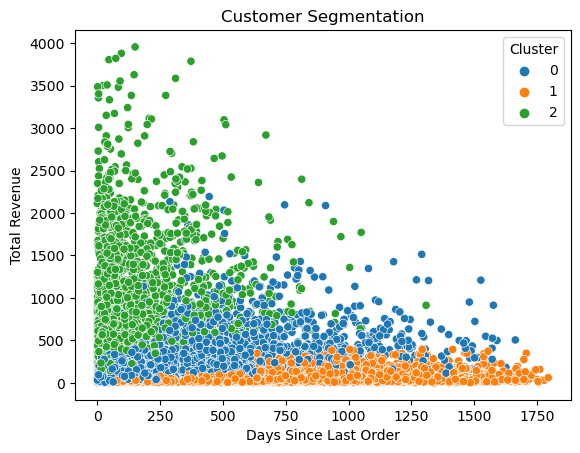

Silhouette Score: -0.0048375280137051835
Calinski_harabasz Score: 1.7121713411715567


In [37]:
sns.scatterplot(x='recency', y='monetary', data=rfm_copy, hue='kmeans_total_scores_n3', palette='tab10', marker='o')
plt.xlabel('Days Since Last Order')
plt.ylabel('Total Revenue')
plt.title('Customer Segmentation')
plt.legend(title='Cluster')

plt.show()

# Evaluate the clustering using silhouette score
silhouette_avg = silhouette_score(rfm_copy, rfm_copy['kmeans_total_scores_n3'])
print(f"Silhouette Score: {silhouette_avg}")
calinski_harabasz = calinski_harabasz_score(rfm_copy, rfm_copy['kmeans_total_scores_n3'])
print(f"Calinski_harabasz Score: {calinski_harabasz}")

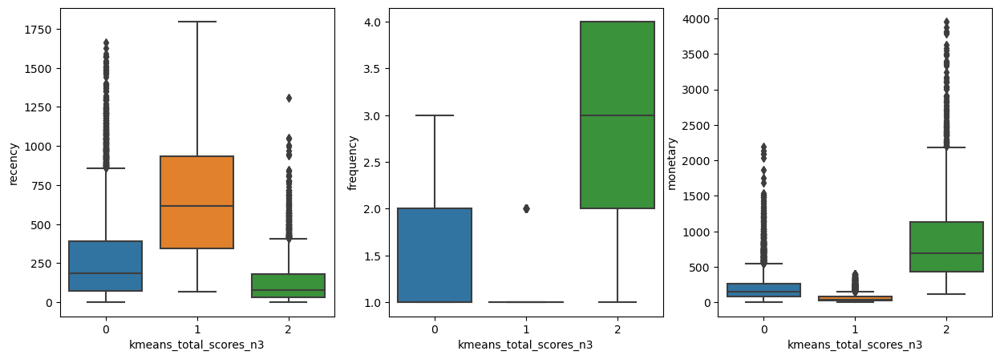

In [38]:
fig, ax = plt.subplots(1,3, figsize=(15,5))
sns.boxplot(data=rfm_copy, x='kmeans_total_scores_n3', y='recency', ax=ax[0])
sns.boxplot(data=rfm_copy, x='kmeans_total_scores_n3', y='frequency', ax=ax[1])
sns.boxplot(data=rfm_copy, x='kmeans_total_scores_n3', y='monetary', ax=ax[2])
plt.show()

- Group 0: mostly purchased in last year, once or twice buyers, low spendings (with long tail)
- Group 1: last purchase some time ago, purchased once, lowest spendings
- Group 2: more recenct buyers (long tail), purchased usually more than once, middle spendings

## Clustering customers without RFM scoring model - Applying Transforming and Scaling

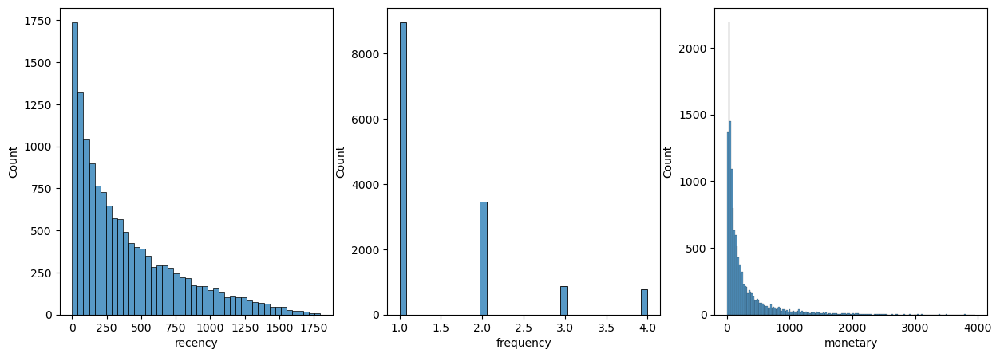

In [39]:
# only have chosen 2 features - the total_orders should have been added too
fig, ax = plt.subplots(1,3, figsize=(15,5))
sns.histplot(rfm_df, x='recency', ax=ax[0])
sns.histplot(rfm_df, x='frequency', ax=ax[1])
sns.histplot(rfm_df, x='monetary', ax=ax[2])
plt.show()

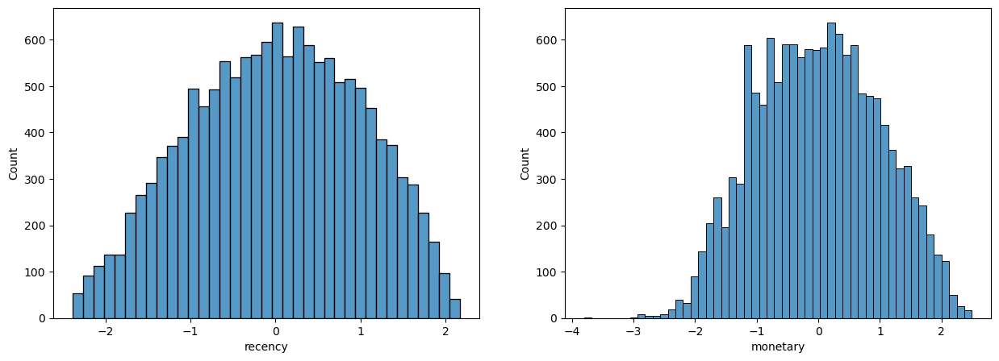

Skew of recency is:  -0.1
Skew of monetary is:  0.02


In [40]:
# Log-transform 'recency' and 'monetary'
# Box Cox as performed before

#to_be_transformed_df = rfm_df[['recency', 'monetary']]
#transformer = PowerTransformer(method='box-cox')
#transformed = transformer.fit_transform(to_be_transformed_df)
#transformed_df = pd.DataFrame(transformed, columns=to_be_transformed_df.columns)

fig, ax = plt.subplots(1,2, figsize=(15,5))
sns.histplot(transformed_df, x='recency', ax=ax[0])
sns.histplot(transformed_df, x='monetary', ax=ax[1])
plt.show()

print('Skew of recency is: ', transformed_df['recency'].skew().round(2))
print('Skew of monetary is: ', transformed_df['monetary'].skew().round(2))


In [41]:
# add frequency again
transformed_df = pd.concat([rfm_df['frequency'],transformed_df[['recency', 'monetary']]], axis=1)

In [42]:
# next standardize all three
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(transformed_df)
scaled = scaler.transform(transformed_df)

path = "../scalers/"
filename = "scaler_after_transf.pkl"
# Check whether the specified path exists or not
isExist = os.path.exists(path)
if not isExist:
    # Create a new directory because it does not exist
    os.makedirs(path)
    print("The new directory is created!")
    
with open(path + filename, "wb") as file:
    pickle.dump(scaler, file)

scaled_df = pd.DataFrame(scaled, columns = transformed_df.columns)
display(scaled_df.head())

,frequency,recency,monetary
0,-0.637895,1.307028,-0.681468
1,-0.637895,-1.359744,-0.416592
2,0.557637,1.711751,-0.323513
3,-0.637895,-0.546953,-0.424773
4,0.557637,-0.774051,1.121951


Training a K-Means model with 2 clusters! 

Initialization complete
Iteration 0, inertia 41645.148058150284.
Iteration 1, inertia 27212.177809591507.
Iteration 2, inertia 25826.55209065586.
Iteration 3, inertia 24847.89909370662.
Iteration 4, inertia 24294.424166916204.
Iteration 5, inertia 24048.93276008633.
Iteration 6, inertia 23981.331049150118.
Iteration 7, inertia 23967.822013385878.
Iteration 8, inertia 23964.6773985772.
Converged at iteration 8: center shift 5.1642178065995486e-05 within tolerance 9.999999999999464e-05.
Initialization complete
Iteration 0, inertia 35442.279219140444.
Iteration 1, inertia 24085.39204758429.
Iteration 2, inertia 23994.967018317206.
Iteration 3, inertia 23969.59648097132.
Iteration 4, inertia 23965.20803478889.
Converged at iteration 4: center shift 9.476345727297666e-05 within tolerance 9.999999999999464e-05.
Initialization complete
Iteration 0, inertia 32205.0975110769.
Iteration 1, inertia 25343.562496959305.
Iteration 2, inertia 24156.19223570

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Iteration 7, inertia 23975.73852439029.
Iteration 8, inertia 23966.504281865753.
Iteration 9, inertia 23964.416199690164.
Converged at iteration 9: center shift 2.0072677432852524e-05 within tolerance 9.999999999999464e-05.
Initialization complete
Iteration 0, inertia 46488.09994141764.
Iteration 1, inertia 26176.295338377022.
Iteration 2, inertia 24904.809071405325.
Iteration 3, inertia 24297.865251802592.
Iteration 4, inertia 24051.13763846721.
Iteration 5, inertia 23982.502964584943.
Iteration 6, inertia 23968.040473000336.
Iteration 7, inertia 23964.727742733696.
Converged at iteration 7: center shift 5.9656020098615466e-05 within tolerance 9.999999999999464e-05.
Initialization complete
Iteration 0, inertia 38084.105595774454.
Iteration 1, inertia 29475.377560814115.
Iteration 2, inertia 25182.903967346974.
Iteration 3, inertia 24026.69807586197.
Iteration 4, inertia 23969.072316722948.
Iteration 5, inertia 23964.77184531997.
Converged at iteration 5: center shift 7.259140865736573

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Iteration 1, inertia 19760.261607276636.
Iteration 2, inertia 19378.34178194262.
Iteration 3, inertia 19048.048931419937.
Iteration 4, inertia 18667.48558282742.
Iteration 5, inertia 18385.138269802817.
Iteration 6, inertia 18290.009106508063.
Iteration 7, inertia 18257.869334128045.
Iteration 8, inertia 18244.061809321945.
Iteration 9, inertia 18235.246977595634.
Iteration 10, inertia 18228.614536974284.
Iteration 11, inertia 18223.50802694649.
Iteration 12, inertia 18220.188470147932.
Iteration 13, inertia 18217.32860768823.
Iteration 14, inertia 18215.46043270421.
Iteration 15, inertia 18214.04557064468.
Iteration 16, inertia 18212.773908379044.
Iteration 17, inertia 18210.795860119564.
Iteration 18, inertia 18208.958653713285.
Iteration 19, inertia 18207.550612596526.
Iteration 20, inertia 18206.70431277778.
Converged at iteration 20: center shift 9.9760362459704e-05 within tolerance 9.999999999999464e-05.
Initialization complete
Iteration 0, inertia 25027.60432607103.
Iteration 1,

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Iteration 8, inertia 13250.193033489912.
Iteration 9, inertia 13248.271241255708.
Iteration 10, inertia 13247.380201913586.
Converged at iteration 10: center shift 5.870683614106637e-05 within tolerance 9.999999999999464e-05.
Initialization complete
Iteration 0, inertia 20216.202726307074.
Iteration 1, inertia 14827.86278126551.
Iteration 2, inertia 14062.768426102417.
Iteration 3, inertia 13570.446570542099.
Iteration 4, inertia 13392.665069572373.
Iteration 5, inertia 13328.48220595772.
Iteration 6, inertia 13296.64689565502.
Iteration 7, inertia 13279.34444709074.
Iteration 8, inertia 13265.863610634264.
Iteration 9, inertia 13258.017693962265.
Iteration 10, inertia 13253.08917469075.
Iteration 11, inertia 13250.284074550262.
Iteration 12, inertia 13248.743092553645.
Iteration 13, inertia 13247.810030438679.
Converged at iteration 13: center shift 5.5829443841968295e-05 within tolerance 9.999999999999464e-05.
Initialization complete
Iteration 0, inertia 19553.84054744336.
Iteration 

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Iteration 1, inertia 12195.553498608777.
Iteration 2, inertia 11579.559610017766.
Iteration 3, inertia 11390.094481681419.
Iteration 4, inertia 11320.03243178512.
Iteration 5, inertia 11287.161872949991.
Iteration 6, inertia 11261.942179274705.
Iteration 7, inertia 11232.86417289218.
Iteration 8, inertia 11202.209449573638.
Iteration 9, inertia 11175.477556733029.
Iteration 10, inertia 11146.324671643059.
Iteration 11, inertia 11116.064492631618.
Iteration 12, inertia 11087.121382440819.
Iteration 13, inertia 11056.252870538516.
Iteration 14, inertia 11028.11421104985.
Iteration 15, inertia 11006.922442824107.
Iteration 16, inertia 10989.792921109272.
Iteration 17, inertia 10973.452790268737.
Iteration 18, inertia 10959.114597042157.
Iteration 19, inertia 10943.98787431751.
Iteration 20, inertia 10927.239972078354.
Iteration 21, inertia 10911.654698051589.
Iteration 22, inertia 10897.373267122133.
Iteration 23, inertia 10884.913277186617.
Iteration 24, inertia 10872.006566882199.
Itera

Iteration 34, inertia 10801.526728118039.
Iteration 35, inertia 10800.694015136723.
Iteration 36, inertia 10799.749768719303.
Iteration 37, inertia 10799.089200615723.
Iteration 38, inertia 10798.47755877464.
Converged at iteration 38: center shift 7.974774917193228e-05 within tolerance 9.999999999999464e-05.
Initialization complete
Iteration 0, inertia 17493.035822619968.
Iteration 1, inertia 13156.110767879469.
Iteration 2, inertia 12045.18774156418.
Iteration 3, inertia 11735.394142310539.
Iteration 4, inertia 11554.541857991902.
Iteration 5, inertia 11398.50106922192.
Iteration 6, inertia 11280.46617882674.
Iteration 7, inertia 11191.95315914569.
Iteration 8, inertia 11134.978274323745.
Iteration 9, inertia 11090.179568230482.
Iteration 10, inertia 11053.956216853767.
Iteration 11, inertia 11025.39008196877.
Iteration 12, inertia 11003.212133511275.
Iteration 13, inertia 10985.567686077386.
Iteration 14, inertia 10969.161389629084.
Iteration 15, inertia 10953.571944715552.
Iteratio

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Iteration 4, inertia 9758.59392043799.
Iteration 5, inertia 9737.004113810355.
Iteration 6, inertia 9722.319061655007.
Iteration 7, inertia 9712.024387356105.
Iteration 8, inertia 9702.844634412802.
Iteration 9, inertia 9692.593888440542.
Iteration 10, inertia 9680.00103402344.
Iteration 11, inertia 9661.084648845033.
Iteration 12, inertia 9636.926382229.
Iteration 13, inertia 9601.832156986591.
Iteration 14, inertia 9544.068926965403.
Iteration 15, inertia 9469.209232665567.
Iteration 16, inertia 9394.111361372328.
Iteration 17, inertia 9337.705822694776.
Iteration 18, inertia 9297.471348807783.
Iteration 19, inertia 9262.482829300123.
Iteration 20, inertia 9242.25941294017.
Iteration 21, inertia 9228.940806941073.
Iteration 22, inertia 9220.894941530263.
Iteration 23, inertia 9214.615561342882.
Iteration 24, inertia 9210.696780914492.
Iteration 25, inertia 9208.430610584386.
Iteration 26, inertia 9207.345195208047.
Iteration 27, inertia 9206.396262049726.
Converged at iteration 27: c

Iteration 13, inertia 9207.426972675428.
Iteration 14, inertia 9206.720747283987.
Iteration 15, inertia 9206.17378861611.
Converged at iteration 15: center shift 5.3632231365092094e-05 within tolerance 9.999999999999464e-05.
Initialization complete
Iteration 0, inertia 15019.330248623235.
Iteration 1, inertia 11331.707954009991.
Iteration 2, inertia 10915.554195886278.
Iteration 3, inertia 10814.852352505353.
Iteration 4, inertia 10759.658909529735.
Iteration 5, inertia 10675.180124479139.
Iteration 6, inertia 10599.939540304513.
Iteration 7, inertia 10535.692006081314.
Iteration 8, inertia 10439.03068648152.
Iteration 9, inertia 10325.800456096707.
Iteration 10, inertia 10209.419396324993.
Iteration 11, inertia 10105.526011317985.
Iteration 12, inertia 9993.351768817462.
Iteration 13, inertia 9857.044621057801.
Iteration 14, inertia 9735.29540410186.
Iteration 15, inertia 9651.682740230615.
Iteration 16, inertia 9604.049580953171.
Iteration 17, inertia 9578.97735746978.
Iteration 18, 

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Initialization complete
Iteration 0, inertia 11638.88169675483.
Iteration 1, inertia 8583.29793903237.
Iteration 2, inertia 8277.439112028174.
Iteration 3, inertia 8182.576836370303.
Iteration 4, inertia 8150.512537401053.
Iteration 5, inertia 8135.614909704285.
Iteration 6, inertia 8128.852631734464.
Iteration 7, inertia 8124.741700982019.
Iteration 8, inertia 8121.989668875869.
Iteration 9, inertia 8119.3450550721855.
Iteration 10, inertia 8116.494677410258.
Iteration 11, inertia 8114.247278356311.
Iteration 12, inertia 8112.084162003955.
Iteration 13, inertia 8109.594723356187.
Iteration 14, inertia 8107.084874437877.
Iteration 15, inertia 8105.390930879899.
Iteration 16, inertia 8103.72900060962.
Iteration 17, inertia 8101.820939696578.
Iteration 18, inertia 8100.197242408527.
Iteration 19, inertia 8098.77407922339.
Iteration 20, inertia 8097.859238442039.
Iteration 21, inertia 8097.032283705436.
Iteration 22, inertia 8096.258921177539.
Iteration 23, inertia 8095.845949000187.
Conv

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Iteration 21, inertia 7253.636946920275.
Iteration 22, inertia 7252.932904747771.
Iteration 23, inertia 7252.254818927647.
Iteration 24, inertia 7251.540474156103.
Iteration 25, inertia 7250.938378298852.
Iteration 26, inertia 7250.2778390352105.
Iteration 27, inertia 7249.724970128712.
Iteration 28, inertia 7248.903910053057.
Iteration 29, inertia 7248.206195297262.
Iteration 30, inertia 7247.395532181412.
Iteration 31, inertia 7246.101192000002.
Iteration 32, inertia 7244.827998271769.
Iteration 33, inertia 7243.617367722691.
Iteration 34, inertia 7242.799213865756.
Iteration 35, inertia 7242.417055280228.
Iteration 36, inertia 7241.971288636224.
Iteration 37, inertia 7241.576087939586.
Converged at iteration 37: center shift 6.558881156146401e-05 within tolerance 9.999999999999464e-05.
Initialization complete
Iteration 0, inertia 9709.560484292617.
Iteration 1, inertia 8002.441286871045.
Iteration 2, inertia 7616.784029591747.
Iteration 3, inertia 7438.559488687521.
Iteration 4, ine

Iteration 1, inertia 8611.133849096284.
Iteration 2, inertia 8437.434180388911.
Iteration 3, inertia 8323.723006387994.
Iteration 4, inertia 8222.013181295612.
Iteration 5, inertia 8141.243369307382.
Iteration 6, inertia 8069.654810404824.
Iteration 7, inertia 8008.726706992927.
Iteration 8, inertia 7955.3804761446545.
Iteration 9, inertia 7897.370949113156.
Iteration 10, inertia 7833.311974869726.
Iteration 11, inertia 7767.313067489083.
Iteration 12, inertia 7682.119172534797.
Iteration 13, inertia 7595.627664065309.
Iteration 14, inertia 7544.329257984288.
Iteration 15, inertia 7513.458559865351.
Iteration 16, inertia 7491.530048957428.
Iteration 17, inertia 7479.205443901562.
Iteration 18, inertia 7472.092198770919.
Iteration 19, inertia 7467.5541975738415.
Iteration 20, inertia 7464.597710647238.
Iteration 21, inertia 7462.090172125541.
Iteration 22, inertia 7460.134066855713.
Iteration 23, inertia 7457.8381787836315.
Iteration 24, inertia 7455.374521235637.
Iteration 25, inertia 

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Iteration 1, inertia 7222.650999535121.
Iteration 2, inertia 6978.135893388253.
Iteration 3, inertia 6881.087679565855.
Iteration 4, inertia 6799.183702068889.
Iteration 5, inertia 6763.397536433636.
Iteration 6, inertia 6742.122652635901.
Iteration 7, inertia 6726.387410854179.
Iteration 8, inertia 6716.017827438713.
Iteration 9, inertia 6707.631913809941.
Iteration 10, inertia 6701.7402317032975.
Iteration 11, inertia 6697.512824011069.
Iteration 12, inertia 6694.584178953828.
Iteration 13, inertia 6692.497043914658.
Iteration 14, inertia 6690.541035274111.
Iteration 15, inertia 6688.751715040977.
Iteration 16, inertia 6687.353069481567.
Iteration 17, inertia 6686.538634837607.
Iteration 18, inertia 6686.089297502822.
Iteration 19, inertia 6685.590876801467.
Iteration 20, inertia 6684.912508130449.
Iteration 21, inertia 6684.24328087793.
Iteration 22, inertia 6683.855299262892.
Converged at iteration 22: center shift 7.51658559421287e-05 within tolerance 9.999999999999464e-05.
Initia

Iteration 14, inertia 6883.569522356671.
Iteration 15, inertia 6851.443556697537.
Iteration 16, inertia 6794.548174805399.
Iteration 17, inertia 6714.464140685677.
Iteration 18, inertia 6643.640827041406.
Iteration 19, inertia 6601.201974614791.
Iteration 20, inertia 6582.4908199527135.
Iteration 21, inertia 6575.712277048438.
Iteration 22, inertia 6573.0755424322615.
Iteration 23, inertia 6572.188441153119.
Iteration 24, inertia 6571.698135261511.
Converged at iteration 24: center shift 4.916161493285309e-05 within tolerance 9.999999999999464e-05.
Initialization complete
Iteration 0, inertia 8398.669266203773.
Iteration 1, inertia 7436.213923605128.
Iteration 2, inertia 7246.753845959125.
Iteration 3, inertia 7176.826554518431.
Iteration 4, inertia 7129.328299244005.
Iteration 5, inertia 7075.604808376411.
Iteration 6, inertia 7018.593378148782.
Iteration 7, inertia 6971.5586197938055.
Iteration 8, inertia 6938.92449916286.
Iteration 9, inertia 6922.123267796527.
Iteration 10, inertia

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Iteration 18, inertia 6162.730968167847.
Iteration 19, inertia 6159.6496712854405.
Iteration 20, inertia 6157.14450463261.
Iteration 21, inertia 6154.455821181741.
Iteration 22, inertia 6152.211730467839.
Iteration 23, inertia 6149.942273707453.
Iteration 24, inertia 6148.208798973294.
Iteration 25, inertia 6146.159840970697.
Iteration 26, inertia 6144.675160637748.
Iteration 27, inertia 6143.264350967156.
Iteration 28, inertia 6142.444485046436.
Iteration 29, inertia 6141.703475842014.
Iteration 30, inertia 6141.05749913643.
Iteration 31, inertia 6140.572354512883.
Converged at iteration 31: center shift 9.376103500358243e-05 within tolerance 9.999999999999464e-05.
Initialization complete
Iteration 0, inertia 8457.268969946774.
Iteration 1, inertia 6685.791841295233.
Iteration 2, inertia 6340.214261624196.
Iteration 3, inertia 6181.062847637249.
Iteration 4, inertia 6107.806058245705.
Iteration 5, inertia 6070.493724399387.
Iteration 6, inertia 6050.08762180293.
Iteration 7, inertia 6

Iteration 14, inertia 6229.6517754751.
Iteration 15, inertia 6224.846941703103.
Iteration 16, inertia 6219.782979054709.
Iteration 17, inertia 6213.984168068015.
Iteration 18, inertia 6207.894067561812.
Iteration 19, inertia 6201.15711546821.
Iteration 20, inertia 6195.470937272591.
Iteration 21, inertia 6189.690737898189.
Iteration 22, inertia 6184.868470580905.
Iteration 23, inertia 6180.279547194799.
Iteration 24, inertia 6177.645636284882.
Iteration 25, inertia 6175.86789705234.
Iteration 26, inertia 6173.991227855453.
Iteration 27, inertia 6172.160762924938.
Iteration 28, inertia 6169.415752156669.
Iteration 29, inertia 6166.718447217373.
Iteration 30, inertia 6164.341634744858.
Iteration 31, inertia 6162.446526819627.
Iteration 32, inertia 6160.8262452541.
Iteration 33, inertia 6159.653399088316.
Iteration 34, inertia 6158.645138575721.
Iteration 35, inertia 6157.694265940801.
Iteration 36, inertia 6156.942913249496.
Iteration 37, inertia 6156.216809242919.
Iteration 38, inertia 

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Iteration 8, inertia 5727.495736017344.
Iteration 9, inertia 5713.081446811964.
Iteration 10, inertia 5699.557792220293.
Iteration 11, inertia 5686.214548592792.
Iteration 12, inertia 5673.93732210515.
Iteration 13, inertia 5662.013976433276.
Iteration 14, inertia 5651.479207779734.
Iteration 15, inertia 5643.5413570567725.
Iteration 16, inertia 5636.194590724104.
Iteration 17, inertia 5630.477430326166.
Iteration 18, inertia 5625.112028372678.
Iteration 19, inertia 5621.337491762819.
Iteration 20, inertia 5618.227595571721.
Iteration 21, inertia 5616.2643571550525.
Iteration 22, inertia 5614.858642021621.
Iteration 23, inertia 5613.742443662434.
Iteration 24, inertia 5612.927231427949.
Iteration 25, inertia 5612.241216827747.
Iteration 26, inertia 5611.816622728833.
Iteration 27, inertia 5611.248363612849.
Iteration 28, inertia 5610.124589594661.
Iteration 29, inertia 5608.749358552539.
Iteration 30, inertia 5607.1185990152035.
Iteration 31, inertia 5605.623099278057.
Iteration 32, in

Iteration 33, inertia 5634.451627869452.
Iteration 34, inertia 5632.473985423661.
Iteration 35, inertia 5630.489669679995.
Iteration 36, inertia 5629.056908039198.
Iteration 37, inertia 5628.209881983665.
Iteration 38, inertia 5627.510049600609.
Iteration 39, inertia 5626.944835023312.
Iteration 40, inertia 5626.49046311984.
Iteration 41, inertia 5626.126524740039.
Converged at iteration 41: center shift 9.056422157869091e-05 within tolerance 9.999999999999464e-05.
Initialization complete
Iteration 0, inertia 7754.190184015339.
Iteration 1, inertia 6183.604511913958.
Iteration 2, inertia 5814.33408523481.
Iteration 3, inertia 5671.21307860805.
Iteration 4, inertia 5618.3584746560755.
Iteration 5, inertia 5595.508677733365.
Iteration 6, inertia 5580.465114881143.
Iteration 7, inertia 5571.114359082125.
Iteration 8, inertia 5564.491200645698.
Iteration 9, inertia 5560.156410808371.
Iteration 10, inertia 5557.028285684479.
Iteration 11, inertia 5554.709794438296.
Iteration 12, inertia 555

Text(0.5, 1.0, 'Silhouette Method showing the optimal k')

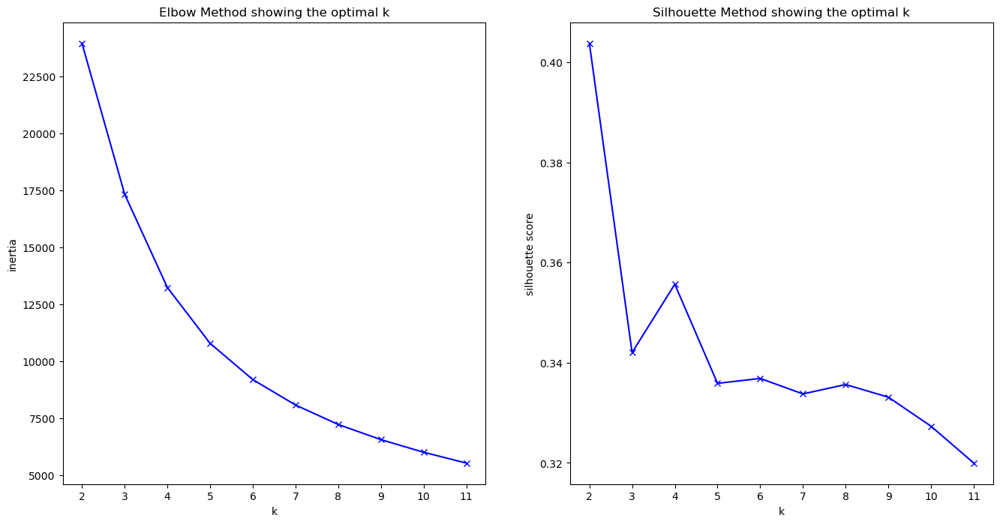

In [43]:
from sklearn.metrics import silhouette_score
K = range(2, 12)

inertia = []
silhouette = []

for k in K:
    print("Training a K-Means model with {} clusters! ".format(k))
    print()
    kmeans = KMeans(n_clusters=k,
                    random_state=1234,
                    verbose=1)
    kmeans.fit(scaled_df)
    
    path = '../models/'
    filename = "kmeans_w_transf_" + str(k) + ".pkl"
    with open(path+filename, "wb") as file:
        pickle.dump(kmeans,file)

    inertia.append(kmeans.inertia_)
    silhouette.append(silhouette_score(scaled_df, kmeans.predict(scaled_df)))


import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

fig, ax = plt.subplots(1,2,figsize=(16,8))
ax[0].plot(K, inertia, 'bx-')
ax[0].set_xlabel('k')
ax[0].set_ylabel('inertia')
ax[0].set_xticks(np.arange(min(K), max(K)+1, 1.0))
ax[0].set_title('Elbow Method showing the optimal k')
ax[1].plot(K, silhouette, 'bx-')
ax[1].set_xlabel('k')
ax[1].set_ylabel('silhouette score')
ax[1].set_xticks(np.arange(min(K), max(K)+1, 1.0))
ax[1].set_title('Silhouette Method showing the optimal k')

In [44]:
# elbow suggests something between 3-5
# silhouette shows only peak at k=2 and once going up at k=4

In [45]:
def load(filename = "filename.pkl"):
    try:
        with open(filename, "rb") as file:
            return pickle.load(file)
    except FileNotFoundError:
        print("File not found!")

In [46]:
best_model = load("../models/kmeans_w_transf_3.pkl")

In [47]:
scaled_copy = scaled_df.copy()
scaled_copy['kmeans_3_cluster'] = best_model.predict(scaled_df)

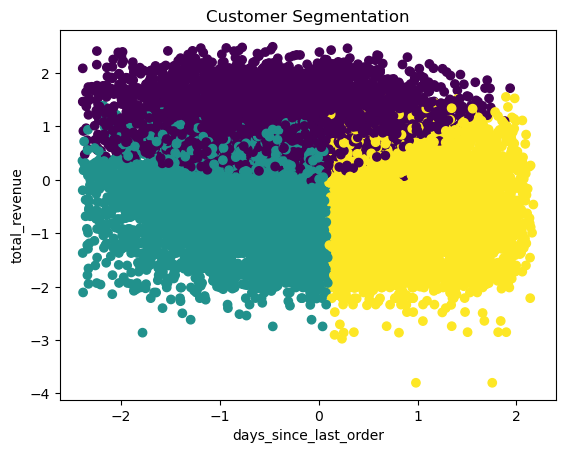

In [48]:
from sklearn.metrics import silhouette_score

# Visualize the clusters (replace 'feature1' and 'feature2' with your actual features)
plt.scatter(scaled_copy['recency'], scaled_copy['monetary'], c=scaled_copy['kmeans_3_cluster'], cmap='viridis')
plt.xlabel('days_since_last_order')
plt.ylabel('total_revenue')
plt.title('Customer Segmentation')
plt.show()

In [49]:
df['kmeans_cluster_n3'] = scaled_copy['kmeans_3_cluster']

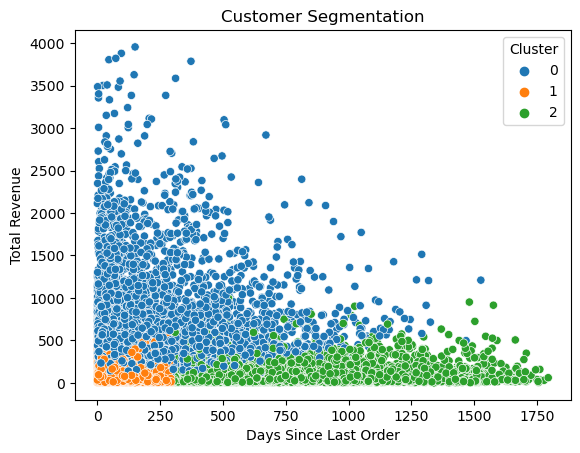

Silhouette Score: 0.431089724533401
Calinski_harabasz Score: 13937.842637664748


In [50]:
sns.scatterplot(x='days_since_last_order', y='total_revenue', data=df, hue='kmeans_cluster_n3', palette='tab10', marker='o')
plt.xlabel('Days Since Last Order')
plt.ylabel('Total Revenue')
plt.title('Customer Segmentation')
plt.legend(title='Cluster')

plt.show()

# Evaluate the clustering using silhouette score
silhouette_avg = silhouette_score(scaled_copy, scaled_copy['kmeans_3_cluster'])
print(f"Silhouette Score: {silhouette_avg}")
calinski_harabasz = calinski_harabasz_score(scaled_copy, scaled_copy['kmeans_3_cluster'])
print(f"Calinski_harabasz Score: {calinski_harabasz}")

In [51]:
df['kmeans_cluster_n3'] = df['kmeans_cluster_n3'].astype(str)

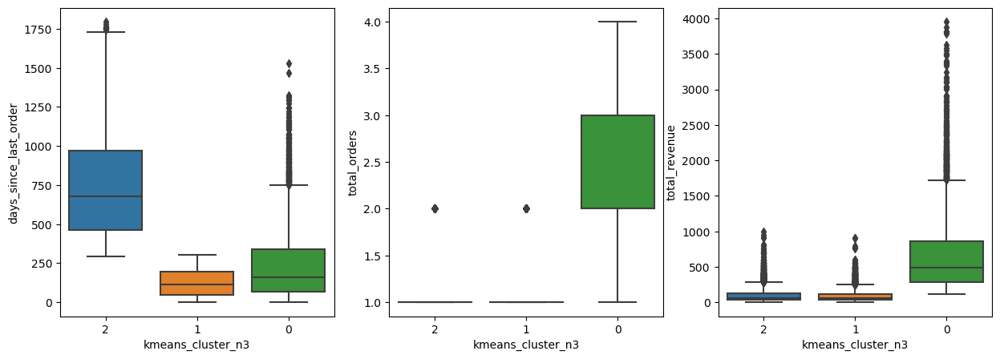

In [52]:
fig, ax = plt.subplots(1,3, figsize=(15,5))
sns.boxplot(data=df, x='kmeans_cluster_n3', y='days_since_last_order', ax=ax[0])
sns.boxplot(data=df, x='kmeans_cluster_n3', y='total_orders', ax=ax[1])
sns.boxplot(data=df, x='kmeans_cluster_n3', y='total_revenue', ax=ax[2])
plt.show()

- Group 0: no action in last year , one-time customers, low spendings
- Group 1: purchased recently, one-time customers, low spendings
- Group 2: purchased recently (but with long tail), recurring customer, middle spendings with upwards potential

## Clustering customers without RFM scoring model - Applying only Scaling

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/var/folders/xv/sbmlp5m11vlc8qbxx5xp1lfw0000gp/T/ipykernel_29274/3027001458.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X2["cluster_kmean"]  = kmeans.predict(X_scaled_df2).astype('str')


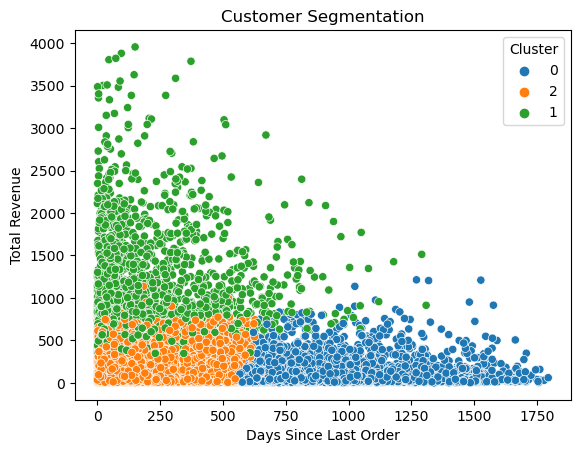

Silhouette Score: 0.4693548628824726
Calinski_harabasz Score: 13476.732640847638


In [53]:
X2 = df[['days_since_last_order', 'total_orders', 'total_revenue']]

scaler2 = StandardScaler()
scaler2.fit(X2)
X_scaled2 = scaler2.transform(X2)

path = "../scalers/.pkl"
filename = "scaler_before_not_transf.pkl" # Path with filename

with open(path+filename, "wb") as file:
    pickle.dump(scaler2,file)

X_scaled_df2 = pd.DataFrame(X_scaled2, columns = X2.columns)


kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(X_scaled_df2)
X2["cluster_kmean"]  = kmeans.predict(X_scaled_df2).astype('str')

# Visualize the clusters (replace 'feature1' and 'feature2' with your actual features)
sns.scatterplot(x='days_since_last_order', y='total_revenue', data=X2, hue='cluster_kmean', palette='tab10', marker='o')
plt.xlabel('Days Since Last Order')
plt.ylabel('Total Revenue')
plt.title('Customer Segmentation')
plt.legend(title='Cluster')

plt.show()

# Evaluate the clustering using silhouette score
silhouette_avg = silhouette_score(X_scaled_df2, kmeans.predict(X_scaled_df2))
print(f"Silhouette Score: {silhouette_avg}")
calinski_harabasz = calinski_harabasz_score(X_scaled_df2, kmeans.predict(X_scaled_df2))
print(f"Calinski_harabasz Score: {calinski_harabasz}")

#### Silhouette Score:

Measures how similar an object is to its own cluster (cohesion) compared to other clusters (separation).
Value ranges from -1 to 1. A higher silhouette score indicates better-defined clusters.

#### Calinski-Harabasz Index (Variance Ratio Criterion):
Measures the ratio of the between-cluster variance to the within-cluster variance. Higher values indicate better-defined clusters.

#### Conclusion
The Silhoette Score of 0.47 is still not great but among the models the best.

The Calinski-Harabasz score of 13,476 is also relatively high, indicating that the clusters in your KMeans model are well-separated. This is a positive result, suggesting that the chosen number of clusters and the resulting clustering configuration are effective in distinguishing between different groups in your data.

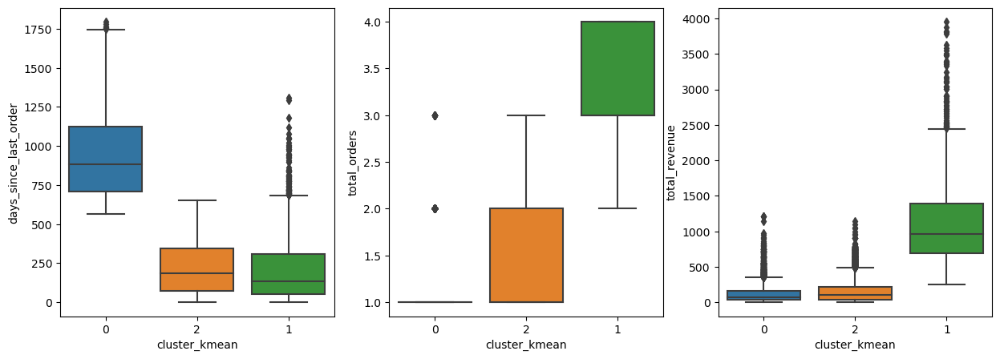

In [54]:
fig, ax = plt.subplots(1,3, figsize=(15,5))
sns.boxplot(data=X2, x='cluster_kmean', y='days_since_last_order', ax=ax[0])
sns.boxplot(data=X2, x='cluster_kmean', y='total_orders', ax=ax[1])
sns.boxplot(data=X2, x='cluster_kmean', y='total_revenue', ax=ax[2])
plt.show()

- Group 0: hasn't purchased within last year, one time purchasers, low spendings
- Group 1: purchased in last year, mostly recurring customers, low spendings
- Group 2: purchased in last year(with long tail), frequent customers, middle spendings with some outliers

## DBSCAN for Clustering
For completion a DBSCAN is also performed and tested for clustering.

/var/folders/xv/sbmlp5m11vlc8qbxx5xp1lfw0000gp/T/ipykernel_29274/3424976696.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['dbscan_cluster'] = dbscan.labels_


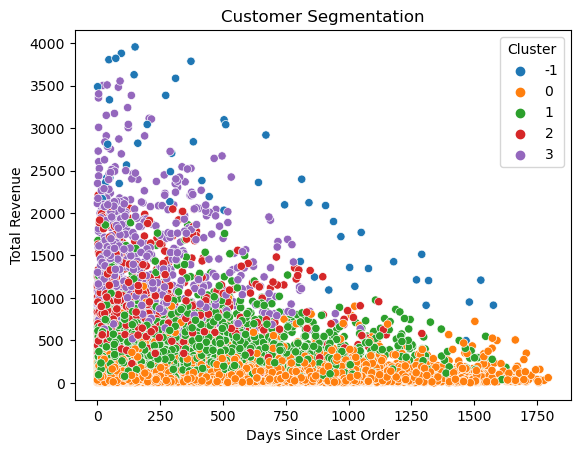

In [55]:
# Import library and create instance of model
from sklearn.cluster import DBSCAN

X = df[['days_since_last_order', 'total_orders', 'total_revenue']]
scaler = StandardScaler()
scaler.fit(X)
X_scaled_np = scaler.transform(X)
X_scaled_df = pd.DataFrame(X_scaled_np, columns=X.columns)

dbscan = DBSCAN(eps=0.5, min_samples=6)

# Fit the DBSCAN model to our data by calling the `fit` method
dbscan.fit_predict(X_scaled_df)

# Access the clusters allocate it to df
X['dbscan_cluster'] = dbscan.labels_

# Visualize the clusters
sns.scatterplot(x='days_since_last_order', y='total_revenue', data=X, hue='dbscan_cluster', palette='tab10', marker='o')
plt.xlabel('Days Since Last Order')
plt.ylabel('Total Revenue')
plt.title('Customer Segmentation')
plt.legend(title='Cluster')

plt.show()

In [56]:
# Evaluate the clustering using silhouette score
silhouette_avg = silhouette_score(X_scaled_df, dbscan.fit_predict(X_scaled_df))
print(f"Silhouette Score: {silhouette_avg}")
calinski_harabasz = calinski_harabasz_score(X_scaled_df, dbscan.fit_predict(X_scaled_df))
print(f"Calinski_harabasz Score: {calinski_harabasz}")

Silhouette Score: 0.34347382100478024
Calinski_harabasz Score: 4820.518090922491


In [57]:
from sklearn.neighbors import NearestNeighbors
import plotly.express as px

neighbors = 6 # The value of MinPoints or mins_samples = 2 * number_of_columns
# X_embedded is your data
nbrs = NearestNeighbors(n_neighbors=neighbors).fit(X_scaled_df)
distances, indices = nbrs.kneighbors(X_scaled_df)
print("The 'distances' array is an 2D-array containing as many rows as points and as many columns as mins_samples", distances.shape)
distance_desc = sorted(distances[:,neighbors-1], reverse=True)
fig = px.line(x=list(range(1,len(distance_desc )+1)),y= distance_desc).update_layout(
    xaxis_title="Array index", yaxis_title="Distance"
)
fig.add_hline(y=0.5, annotation_text="Default value of epsilon in DBSCAN") #0.5 is always the default epsilon
fig.show()

The 'distances' array is an 2D-array containing as many rows as points and as many columns as mins_samples (14047, 6)


In [58]:
(min(distance_desc),max(distance_desc))

(0.0028200298206704708, 1.5605921671898515)

In [59]:
from kneed import KneeLocator
kneedle = KneeLocator(range(1,len(distance_desc)+1),  #x values
                      distance_desc, # y values
                      S=1.0, #parameter suggested from paper
                      curve="convex", #parameter from figure (see https://mmerevise.co.uk/a-level-maths-revision/convex-and-concave-curves/)
                      direction="decreasing") #parameter from figure
print("The epsilon value for which the distance plot has the biggest change in the slope is: {:.2f}".format(kneedle.knee_y))

The epsilon value for which the distance plot has the biggest change in the slope is: 0.67


/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/umap/umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.



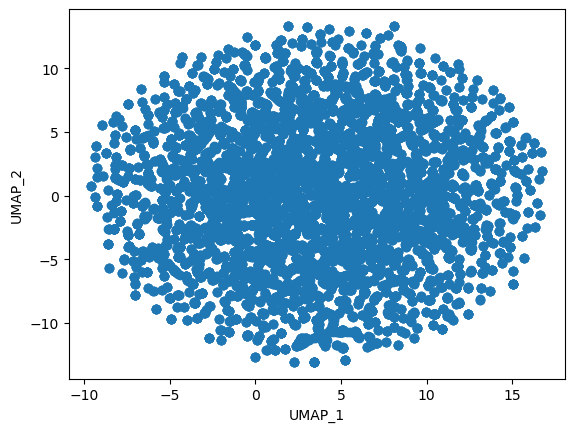

In [60]:
from umap import UMAP

X = df[['days_since_last_order', 'total_orders', 'total_revenue']]
reducer = UMAP(n_neighbors=3, n_components=2,random_state=42)
reducer.fit(X)

X_umap_transformed = reducer.transform(X)
X_umap_transformed_df = pd.DataFrame(X_umap_transformed, columns=["UMAP_1","UMAP_2"])

fig, ax = plt.subplots()
ax.scatter(X_umap_transformed_df['UMAP_1'],X_umap_transformed_df['UMAP_2'])
ax.set_xlabel("UMAP_1")
ax.set_ylabel("UMAP_2")
plt.show()

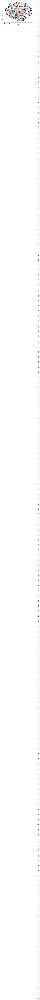

In [61]:
import colorcet as cc

dbscan = DBSCAN(eps=0.2)

# Fit the DBSCAN model to our data by calling the `fit` method
yhat = dbscan.fit_predict(X_umap_transformed_df)

# Access the clusters allocate it to df
X_umap_transformed_df['dbscan_cluster'] = yhat

# retrieve unique clusters
cluster_dbscan = np.unique(yhat)

# Visualize the clusters
# Creating a pallette of hihg contrast colors with as many color as cluster labels
custom_palette = sns.color_palette(cc.glasbey, n_colors=cluster_dbscan.size)
# Modifiying the palette to set the color "black=(0.,0.,0.)" to the label "-1" #(R,G,B)
custom_palette = [color if cluster_dbscan != -1 else (0.,0.,0.) for cluster_dbscan, color in zip(cluster_dbscan,custom_palette)]
sns.scatterplot(X_umap_transformed_df, x="UMAP_1", y="UMAP_2", hue="dbscan_cluster", palette=custom_palette)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left');
plt.show()

In [62]:
print("The Silhouette score of the model is: ",round(silhouette_score(X_umap_transformed_df, dbscan.fit_predict(X_umap_transformed_df)),2))
print("The Calinksi-Harabasz score of the model is: ",round(calinski_harabasz_score(X_umap_transformed_df, dbscan.fit_predict(X_umap_transformed_df)),2))

The Silhouette score of the model is:  0.84
The Calinksi-Harabasz score of the model is:  8824.67


The scores are good but the clustering overfits. There are way too many clusters.
Therefore, the KMeans Clustering without transforming the variables before looks still the best.

In [63]:
# Adding the clusters to the original df:
df['kmeans_cluster_wo_transf'] = X2["cluster_kmean"] # aka the best model

# For later checks (in the model creation), also the other models are added:
df.rename(columns={'kmeans_cluster_n3': 'kmeans_cluster_w_transf'}, inplace=True)
#df['kmeans_cluster_w_transf'] = scaled_copy["kmeans_3_cluster"] 
df['kmeans_rfm_score_based'] = rfm_copy['kmeans_total_scores_n3']

## Comparing all Segmentation Models in 3D
Summing it up and coming to a conclusion, let's have a look at the 3D Model of the three clusters (without DBSCAN)

In [64]:
# This segmentation looks the best:days_since_last_order
fig = px.scatter_3d(df, x='total_revenue', y='total_orders', 
                    z='days_since_last_order',color='kmeans_cluster_wo_transf')
fig.show()

In [65]:
df['kmeans_cluster_w_transf'] = df['kmeans_cluster_w_transf'].astype('str')

fig = px.scatter_3d(df, x='total_revenue', y='total_orders', 
                    z='days_since_last_order',color='kmeans_cluster_w_transf')
fig.show()

In [66]:
df['kmeans_rfm_score_based'] = df['kmeans_rfm_score_based'].astype('str')
fig = px.scatter_3d(df, x='total_revenue', y='total_orders', 
                    z='days_since_last_order',color='kmeans_rfm_score_based')
fig.show()

## Summary

The segmenation model that doesn't transform the variables upfront works best with a silhouette score of 0.46 and a  Calinski-Harabasz score of 11,983.
RFM scoring can be skipped as only applying the K-means to the variables (that areequivalent to RFM) is sufficient.
The segmentation result is not perfect but is able to put the customers into three general buckets.

I suggest to iterate through other options:
- leaving out the factor frequency as the max amount per customers is only 4
- group frequency to 0, 1: for one-time-purchasers & more frequent purchasers
- include days_since_registration as tenure and include it in the model
- try clustering with other variables and not only RFM features
    - tested already and doesn't give good insights

In [67]:
df.head()

,user_id,registration_date,age,gender,city,country,first_order_date,last_order_date,total_orders,avg_order_items,...,days_since_registration,days_until_first_order,days_betw_first_last_order,days_until_last_order,age_class,registration_year,registration_month,kmeans_cluster_w_transf,kmeans_cluster_wo_transf,kmeans_rfm_score_based
0,18,2020-06-18 10:15:00+00:00,31,M,Schwedt/Oder,Poland,2021-05-26 10:15:00+00:00,2021-05-26 10:15:00+00:00,1,1.0,...,1291.572917,342.0,0.0,342.0,31-40,2020,6,2,0,1
1,29,2023-09-22 07:18:00+00:00,23,M,Pudsey,United Kingdom,2023-11-29 07:18:00+00:00,2023-11-29 07:18:00+00:00,1,2.0,...,100.695833,68.0,0.0,68.0,19-30,2023,9,1,2,0
2,33,2019-02-14 17:19:00+00:00,12,M,Bogatynia,Poland,2020-06-02 17:19:00+00:00,2020-06-11 17:19:00+00:00,2,1.0,...,1781.278472,474.0,9.0,483.0,0-18,2019,2,2,0,1
3,49,2023-04-11 02:46:00+00:00,62,M,Bailleul,France,2023-08-20 02:46:00+00:00,2023-08-20 02:46:00+00:00,1,1.0,...,264.884722,131.0,0.0,131.0,61-70,2023,4,1,2,0
4,50,2023-05-01 13:46:00+00:00,15,F,Linares,Spain,2023-07-10 13:46:00+00:00,2023-09-27 13:46:00+00:00,2,1.5,...,244.426389,70.0,79.0,149.0,0-18,2023,5,0,2,2


In [68]:
df.columns

Index(['user_id', 'registration_date', 'age', 'gender', 'city', 'country',
       'first_order_date', 'last_order_date', 'total_orders',
       'avg_order_items', 'total_revenue', 'avg_order_value',
       'avg_days_between_orders', 'order_frequency_per_year',
       'days_since_first_order', 'days_since_last_order',
       'days_since_registration', 'days_until_first_order',
       'days_betw_first_last_order', 'days_until_last_order', 'age_class',
       'registration_year', 'registration_month', 'kmeans_cluster_w_transf',
       'kmeans_cluster_wo_transf', 'kmeans_rfm_score_based'],
      dtype='object')

In [69]:
df['revenue_per_lifetime_days'] = df['total_revenue']/(df['days_betw_first_last_order'].replace(0,1))

In [70]:
df.to_csv('../data/cleaned/customer_information_with_segments.csv', index=False)

##### functions

In [71]:
def customer_clusters(df: pd.DataFrame, recency= 'recency', frequency= 'frequency', monetary= 'monetary', k= 3):
    """
    Input data frame with RFM-alike columns that will be used for clustering.
    Function scales variables and performs a KMeans Clustering with k=3 default.
    Returns df with appended Kmeans Clusters.
    """

    X = df[[recency, frequency, monetary]]

    scaler = StandardScaler()
    scaler.fit(X)
    X_scaled = scaler.transform(X)

    X_scaled_df = pd.DataFrame(X_scaled, columns = X.columns)


    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled_df)
    X["cluster_kmean"]  = kmeans.predict(X_scaled_df)

    return X